In [1]:
import pandas as pd
import os
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import json
from IPython.display import display, Markdown

import sys
sys.path.append('../')

import utils
from evalutils.roc import get_bootstrapped_roc_ci_curves
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

## directory where results are
EXPERIMENT_DIR = f"/data/bodyct/experiments/lung-malignancy-fairness-shaurya"
NLST_PREDS = f"{EXPERIMENT_DIR}/nlst"

TEAMS_DIR = "C:/Users/shaur/OneDrive - Radboudumc/Documents - Master - Shaurya Gaur/General/Malignancy-Estimation Results/nlst"
NLST_PREDS = TEAMS_DIR ## Comment out if not using Teams backup (aka Chansey is up :)

In [2]:
nlst_preds_nodule = pd.read_csv(f"{NLST_PREDS}/nlst_demov2_allmodels.csv")
nlst_preds_nodule.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16077 entries, 0 to 16076
Columns: 102 entries, PatientID to Married
dtypes: bool(10), float64(77), int64(11), object(4)
memory usage: 11.4+ MB


In [3]:
with open(f'{NLST_PREDS}/nlst_demo_v2_cols.json') as json_data:
    nlst_democols = json.load(json_data)
    json_data.close()

In [51]:
nlst_preds = utils.prep_nlst_preds(nlst_preds_nodule, scanlevel=True, tijmen=False, sybil=True)
nlst_preds.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5911 entries, 0 to 10150
Data columns (total 96 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   PatientID              5911 non-null   int64  
 1   StudyDate              5911 non-null   int64  
 2   SeriesInstanceUID      5911 non-null   object 
 3   LesionID               5911 non-null   int64  
 4   Spiculation            5911 non-null   bool   
 5   Diameter [mm]          5911 non-null   float64
 6   Age                    5911 non-null   int64  
 7   Gender                 5911 non-null   int64  
 8   FamilyHistoryLungCa    5911 non-null   bool   
 9   Emphysema              5911 non-null   bool   
 10  NoduleInUpperLung      5911 non-null   bool   
 11  NoduleCounts           5911 non-null   int64  
 12  SCT_EPI_LOC            5636 non-null   float64
 13  xie_gc_gclobe150       275 non-null    float64
 14  loclup                 581 non-null    float64
 15  locrup  

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:344: FutureWarning: The provided callable <built-in function max> is currently using SeriesGroupBy.max. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "max" instead.
  df[c] = dfgb[c].transform(max)
c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:344: FutureWarning: The provided callable <built-in function max> is currently using SeriesGroupBy.max. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "max" instead.
  df[c] = dfgb[c].transform(max)


In [52]:
MODEL_TO_COL = {
    "Venkadesh": "DL",
    # "de Haas Combined": "Thijmen_mean",
    "de Haas Local": "Thijmen_local",
    "de Haas Global (hidden nodule)": "Thijmen_global_hidden",
    # "de Haas Global (shown nodule)": "Thijmen_global_show",
    "Sybil": "sybil_year1",
    "PanCan2b": "PanCan2b",
}

Sanity check - let's see internal NLST validation results.

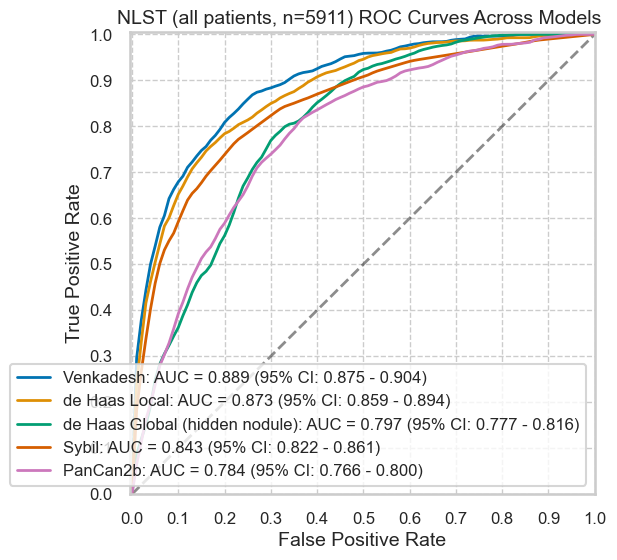

In [53]:
utils.rocs_models(nlst_preds, models=MODEL_TO_COL, dataset_label="NLST")

In [54]:
def plot_by_category(df, cat):
    display(Markdown(f"#### {cat}"))
    catinfo, perfs, sigtestresults = utils.roc_cm_by_category(df, cat, MODEL_TO_COL)
    display(catinfo)
    
    if sigtestresults is not None:
        print("Hanley-McNeil significance test results:")
        display(sigtestresults)
    else:
        print("More than binary: not computing significance test results.")

    # for m in perfs:
    #     print(m)
    #     display(perfs[m])

## Split Data by a Category

#### Gender

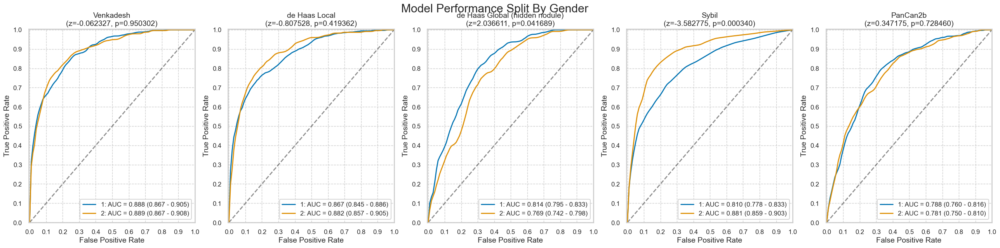

,num,pct,num_mal,pct_mal
1,3441,58.2135,337,9.793665
2,2470,41.7865,244,9.878543


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-0.062327,-0.807528,2.036611,-3.582775,0.347175
p,0.950302,0.419362,0.041689,0.000340,0.728460


In [55]:
SPLIT_CAT = 'Gender'
split_groups = nlst_preds.groupby(SPLIT_CAT)
plot_by_category(nlst_preds, SPLIT_CAT)

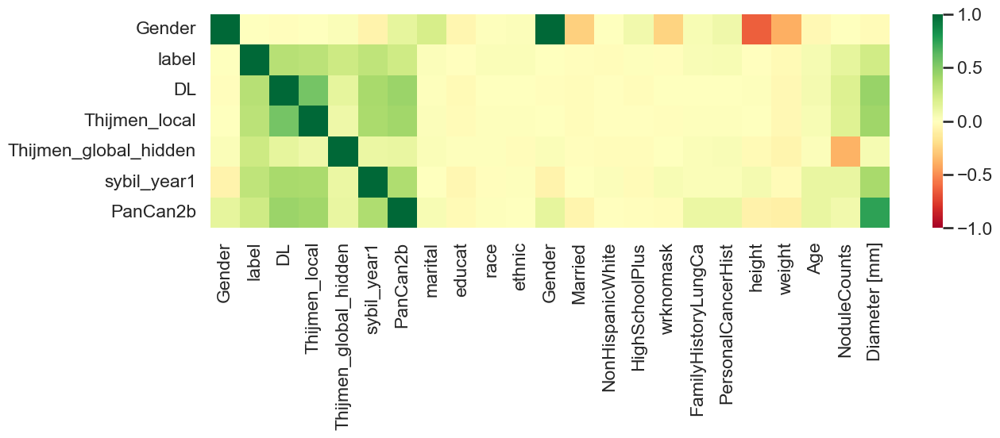

In [ ]:
cols_list = list(set([SPLIT_CAT, 'label'] + list(MODEL_TO_COL.values()) + nlst_democols['cat']['demo'] + nlst_democols['cat']['other'] + nlst_democols['num']['demo'] + nlst_democols['num']['other'] + ['Diameter [mm]'] + nlst_democols['cat']['smoke'] + nlst_democols['num']['smoke'] ))
correlations = nlst_preds[cols_list].corr(method='kendall').round(4)

corr_rows = [SPLIT_CAT, 'label'] + list(MODEL_TO_COL.values())
corr_cols = [SPLIT_CAT, 'label'] + nlst_democols['cat']['demo'] + nlst_democols['cat']['other'] + nlst_democols['num']['demo'] + nlst_democols['num']['other'] + ['Diameter [mm]'] + nlst_democols['cat']['smoke'] + nlst_democols['num']['smoke'] 
plt.figure(figsize=(len(corr_cols) * 0.6, len(corr_rows) * 0.5))
sns.heatmap(correlations.loc[corr_rows, corr_cols], cmap='RdYlGn', vmin=-1, vmax=1)
plt.show()

## Plot intersectional results by category

In [57]:
def plot_intersectional(df, cat, split_cat=SPLIT_CAT, split_groups=split_groups):
    for splitval, splitdf in split_groups:
        display(Markdown(f"#### {cat}: {split_cat} = {splitval}"))
        catinfo, perfs, sigtestresults = utils.roc_cm_by_category(splitdf, cat, MODEL_TO_COL)
        display(catinfo)
        
        if sigtestresults is not None:
            print("Hanley-McNeil significance test results:")
            display(sigtestresults)
        else:
            print("More than binary: not computing significance test results.")

        # for m in perfs:
        #     print(m)
        #     display(perfs[m])

### Included columns (from predictions)

#### wrknomask: Gender = 1

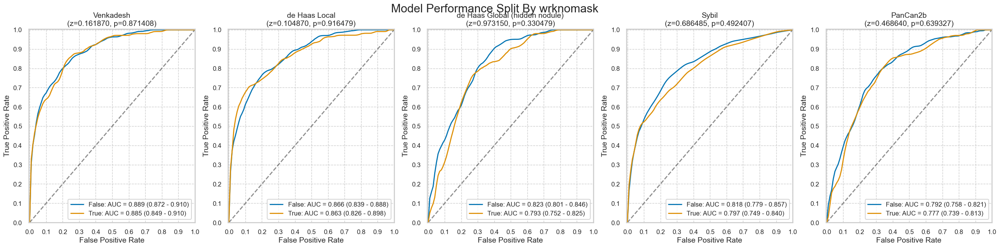

,num,pct,num_mal,pct_mal
False,2257,65.591398,228,10.101905
True,1184,34.408602,109,9.206081


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.161870,0.104870,0.973150,0.686485,0.468640
p,0.871408,0.916479,0.330479,0.492407,0.639327


#### wrknomask: Gender = 2

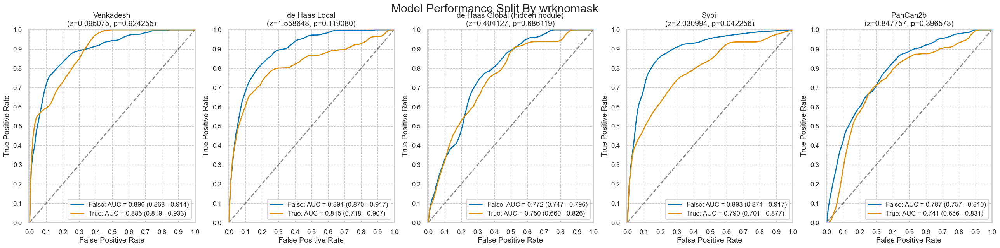

,num,pct,num_mal,pct_mal
False,2150,87.044534,214,9.953488
True,320,12.955466,30,9.375000


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.095075,1.558648,0.404127,2.030994,0.847757
p,0.924255,0.119080,0.686119,0.042256,0.396573


#### FamilyHistoryLungCa: Gender = 1

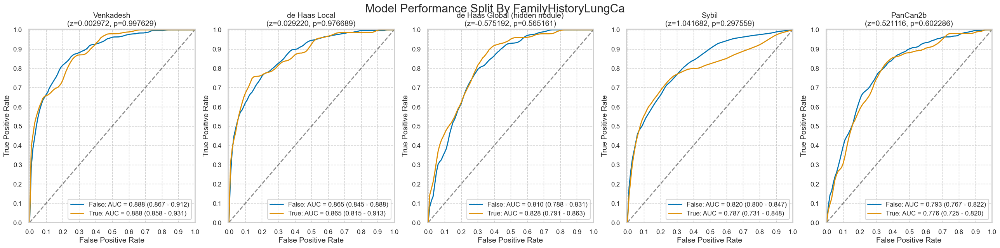

,num,pct,num_mal,pct_mal
False,2609,75.820982,239,9.160598
True,832,24.179018,98,11.778846


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.002972,0.029220,-0.575192,1.041682,0.521116
p,0.997629,0.976689,0.565161,0.297559,0.602286


#### FamilyHistoryLungCa: Gender = 2

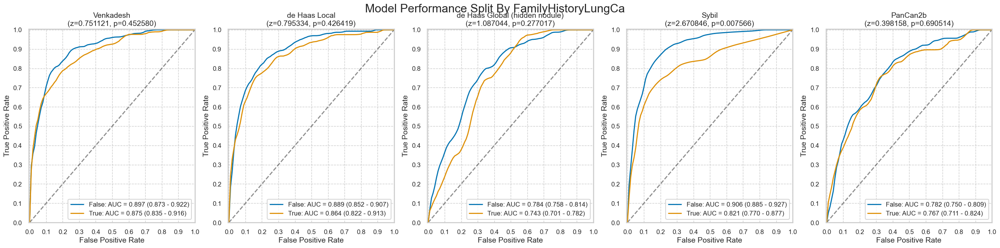

,num,pct,num_mal,pct_mal
False,1775,71.862348,162,9.126761
True,695,28.137652,82,11.798561


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.751121,0.795334,1.087044,2.670846,0.398158
p,0.452580,0.426419,0.277017,0.007566,0.690514


#### PersonalCancerHist: Gender = 1

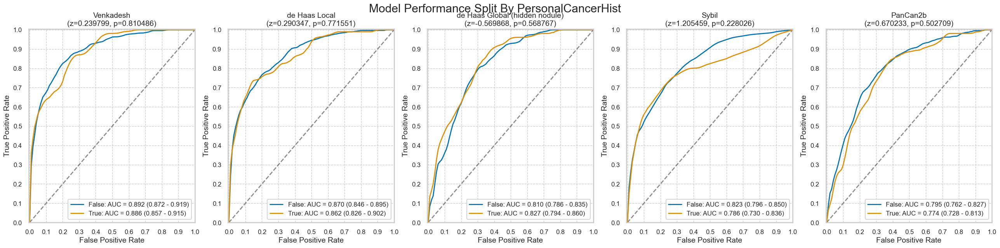

,num,pct,num_mal,pct_mal
False,2548,74.048242,232,9.105181
True,893,25.951758,105,11.758119


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.239799,0.290347,-0.569868,1.205459,0.670233
p,0.810486,0.771551,0.568767,0.228026,0.502709


#### PersonalCancerHist: Gender = 2

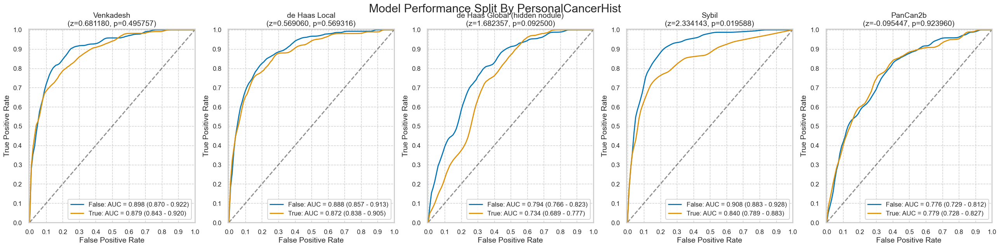

,num,pct,num_mal,pct_mal
False,1635,66.194332,145,8.868502
True,835,33.805668,99,11.856287


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.681180,0.569060,1.682357,2.334143,-0.095447
p,0.495757,0.569316,0.092500,0.019588,0.923960


In [58]:
for c in nlst_democols['cat']['other']:
    plot_intersectional(nlst_preds, c)

### Demographics

#### marital: Gender = 1

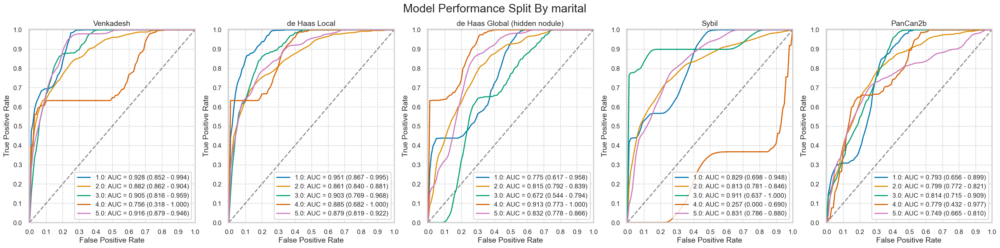

,num,pct,num_mal,pct_mal
1.0,116,3.377985,7,6.034483
2.0,2669,77.722772,262,9.816411
3.0,127,3.698311,9,7.086614
4.0,45,1.310425,3,6.666667
5.0,477,13.890507,54,11.320755


More than binary: not computing significance test results.


#### marital: Gender = 2

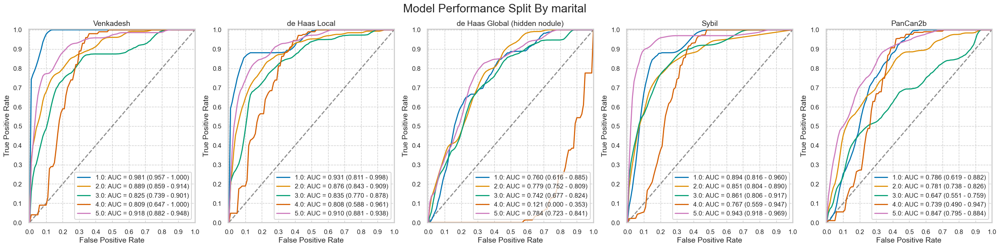

,num,pct,num_mal,pct_mal
1.0,113,4.586039,9,7.964602
2.0,1305,52.962662,122,9.348659
3.0,380,15.422078,40,10.526316
4.0,20,0.811688,2,10.000000
5.0,646,26.217532,71,10.990712


More than binary: not computing significance test results.


#### educat: Gender = 1

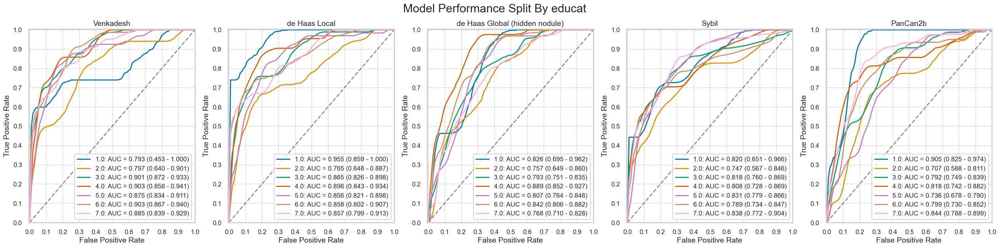

,num,pct,num_mal,pct_mal
1.0,95,2.811483,8,8.421053
2.0,171,5.060669,19,11.111111
3.0,768,22.728618,76,9.895833
4.0,470,13.909441,45,9.574468
5.0,723,21.396863,67,9.266943
6.0,600,17.756733,65,10.833333
7.0,552,16.336194,46,8.333333


More than binary: not computing significance test results.


#### educat: Gender = 2

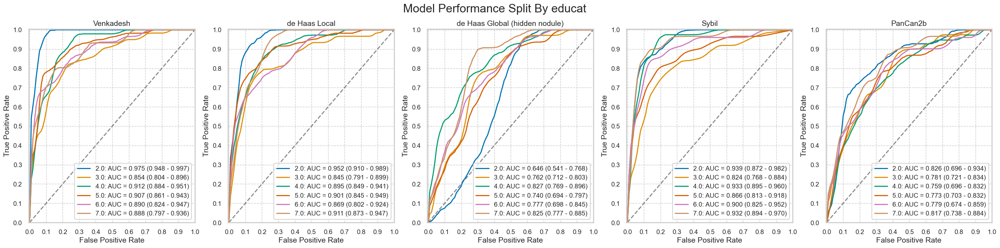

,num,pct,num_mal,pct_mal
1.0,16,0.660884,1,6.250000
2.0,119,4.915324,13,10.924370
3.0,711,29.368030,65,9.142053
4.0,382,15.778604,42,10.994764
5.0,578,23.874432,59,10.207612
6.0,313,12.928542,31,9.904153
7.0,302,12.474184,30,9.933775


More than binary: not computing significance test results.


#### race: Gender = 1

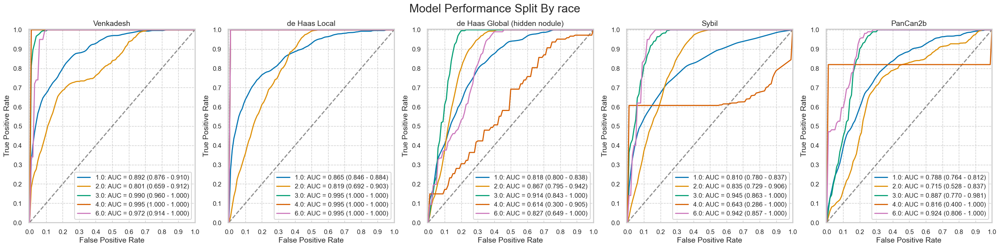

,num,pct,num_mal,pct_mal
1.0,3221,94.016346,312,9.686433
2.0,85,2.481027,13,15.294118
3.0,53,1.546994,3,5.660377
4.0,13,0.379451,5,38.461538
5.0,16,0.467017,0,0.000000
6.0,38,1.109165,2,5.263158


More than binary: not computing significance test results.


#### race: Gender = 2

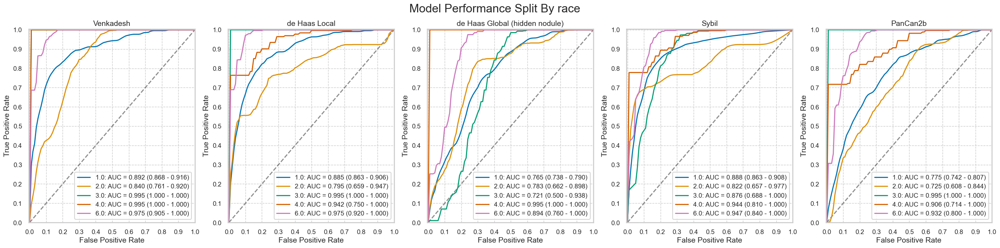

,num,pct,num_mal,pct_mal
1.0,2302,93.463256,218,9.470026
2.0,103,4.181892,15,14.563107
3.0,19,0.771417,3,15.789474
4.0,10,0.406009,3,30.000000
5.0,2,0.081202,1,50.000000
6.0,27,1.096224,4,14.814815


More than binary: not computing significance test results.


#### ethnic: Gender = 1

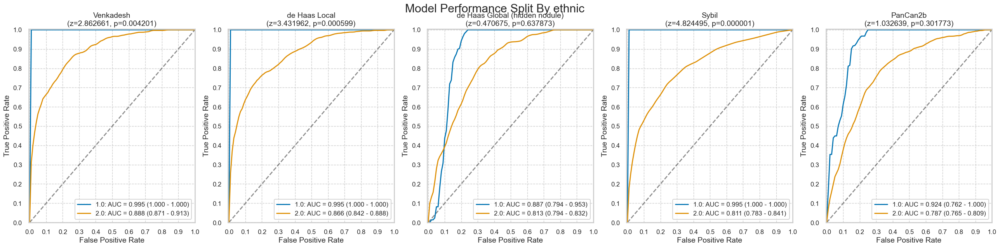

,num,pct,num_mal,pct_mal
1.0,65,1.900585,2,3.076923
2.0,3355,98.099415,333,9.925484


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,2.862661,3.431962,0.470675,4.824495,1.032639
p,0.004201,0.000599,0.637873,0.000001,0.301773


#### ethnic: Gender = 2

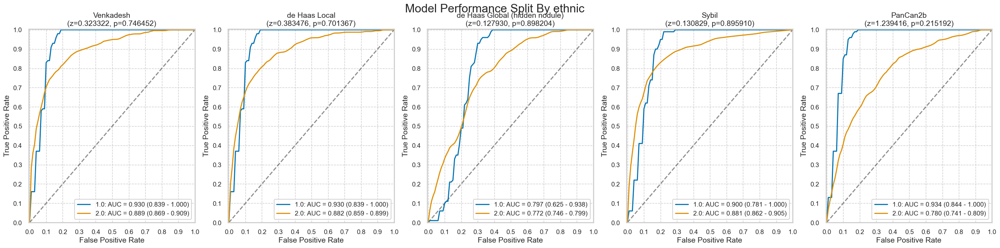

,num,pct,num_mal,pct_mal
1.0,33,1.343101,2,6.060606
2.0,2424,98.656899,241,9.942244


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.323322,0.383476,0.127930,0.130829,1.239416
p,0.746452,0.701367,0.898204,0.895910,0.215192


#### Gender: Gender = 1

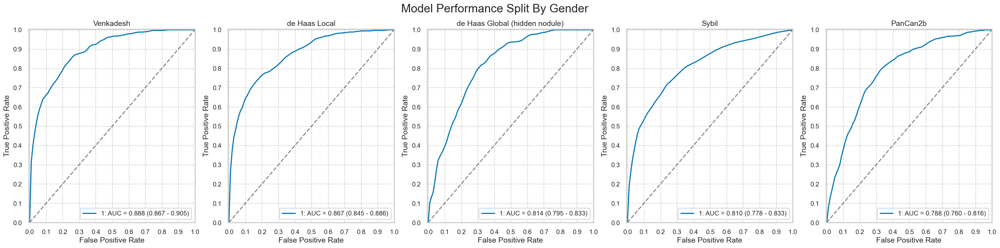

,num,pct,num_mal,pct_mal
1,3441,100.0,337,9.793665


More than binary: not computing significance test results.


#### Gender: Gender = 2

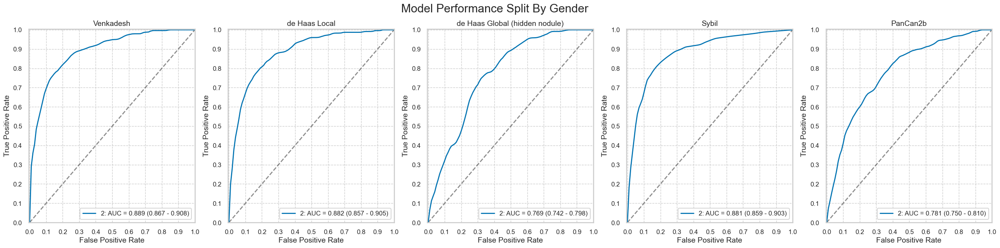

,num,pct,num_mal,pct_mal
2,2470,100.0,244,9.878543


More than binary: not computing significance test results.


#### Married: Gender = 1

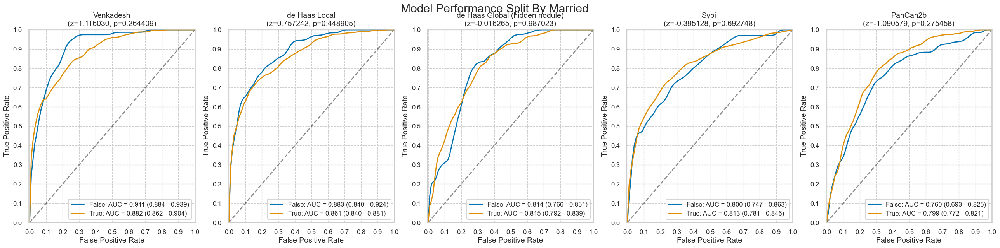

,num,pct,num_mal,pct_mal
False,772,22.435339,75,9.715026
True,2669,77.564661,262,9.816411


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,1.116030,0.757242,-0.016265,-0.395128,-1.090579
p,0.264409,0.448905,0.987023,0.692748,0.275458


#### Married: Gender = 2

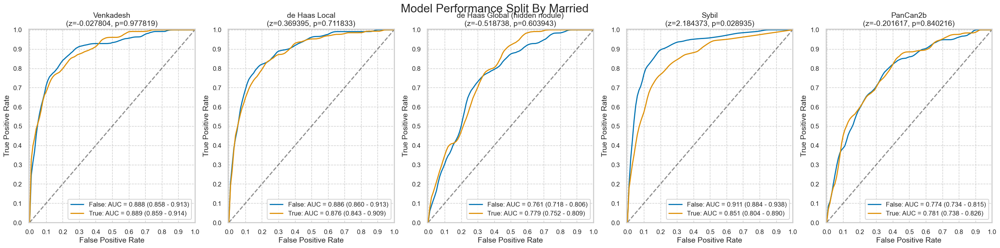

,num,pct,num_mal,pct_mal
False,1165,47.165992,122,10.472103
True,1305,52.834008,122,9.348659


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-0.027804,0.369395,-0.518738,2.184373,-0.201617
p,0.977819,0.711833,0.603943,0.028935,0.840216


#### NonHispanicWhite: Gender = 1

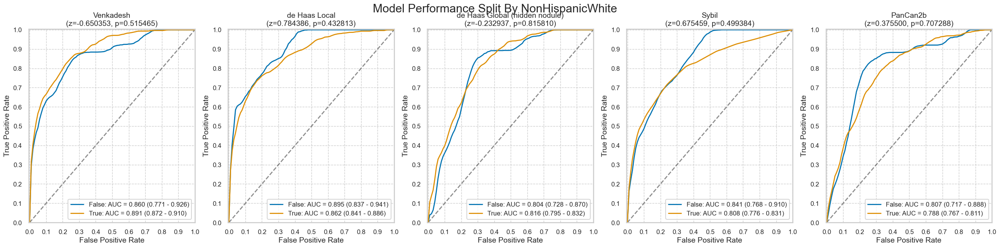

,num,pct,num_mal,pct_mal
False,280,8.137169,27,9.642857
True,3161,91.862831,310,9.807023


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-0.650353,0.784386,-0.232937,0.675459,0.375500
p,0.515465,0.432813,0.815810,0.499384,0.707288


#### NonHispanicWhite: Gender = 2

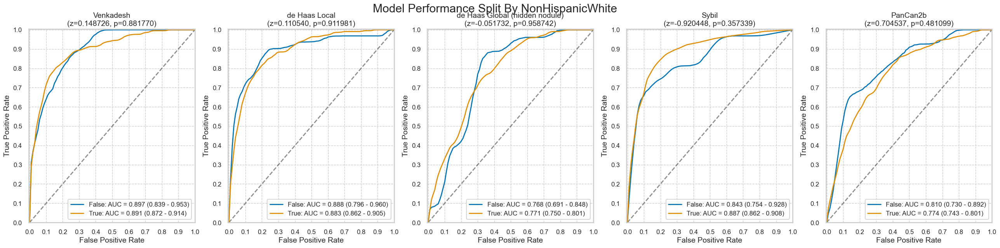

,num,pct,num_mal,pct_mal
False,201,8.137652,28,13.930348
True,2269,91.862348,216,9.519612


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.148726,0.110540,-0.051732,-0.920448,0.704537
p,0.881770,0.911981,0.958742,0.357339,0.481099


#### HighSchoolPlus: Gender = 1

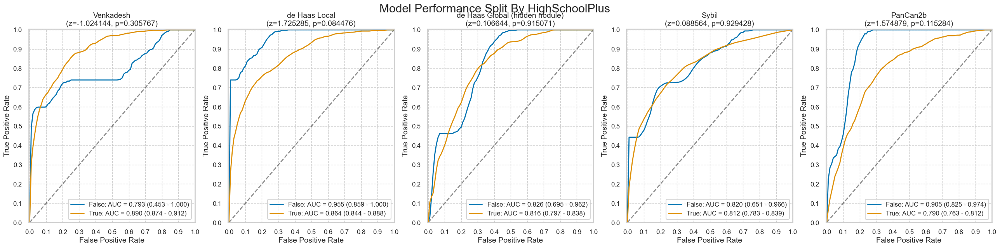

,num,pct,num_mal,pct_mal
False,95,2.760825,8,8.421053
True,3346,97.239175,329,9.832636


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-1.024144,1.725285,0.106644,0.088564,1.574879
p,0.305767,0.084476,0.915071,0.929428,0.115284


#### HighSchoolPlus: Gender = 2

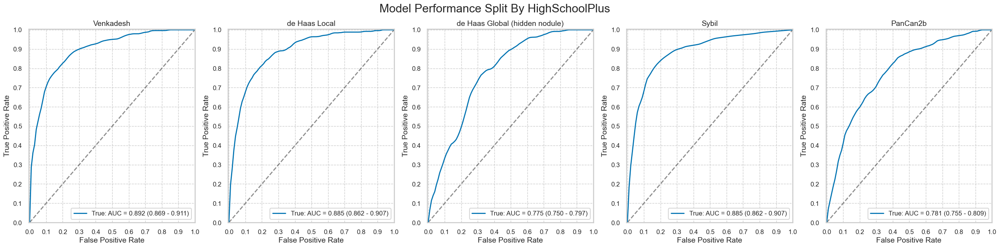

,num,pct,num_mal,pct_mal
False,16,0.647773,1,6.2500
True,2454,99.352227,243,9.9022


More than binary: not computing significance test results.


In [59]:
for cat in nlst_democols['cat']['demo']:
    plot_intersectional(nlst_preds, cat)

### Smoking

#### cigar: Gender = 1

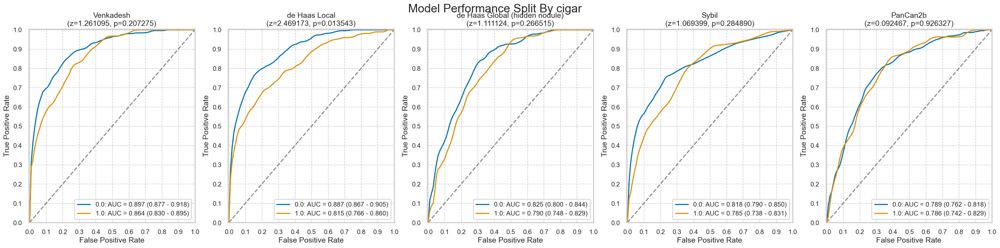

,num,pct,num_mal,pct_mal
0.0,2360,68.905109,233,9.872881
1.0,1065,31.094891,102,9.577465


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,1.261095,2.469173,1.111124,1.069399,0.092467
p,0.207275,0.013543,0.266515,0.284890,0.926327


#### cigar: Gender = 2

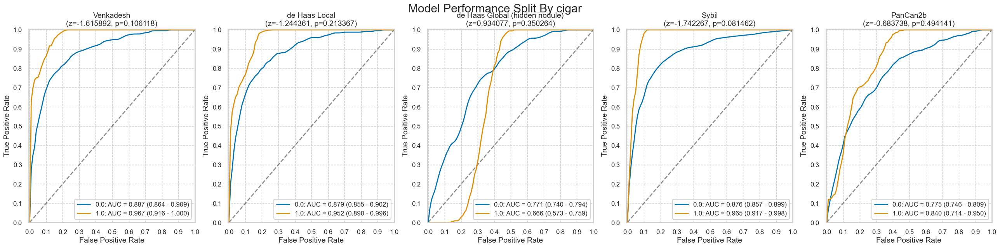

,num,pct,num_mal,pct_mal
0.0,2378,96.627387,237,9.966358
1.0,83,3.372613,7,8.433735


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-1.615892,-1.244361,0.934077,-1.742267,-0.683738
p,0.106118,0.213367,0.350264,0.081462,0.494141


#### cigsmok: Gender = 1

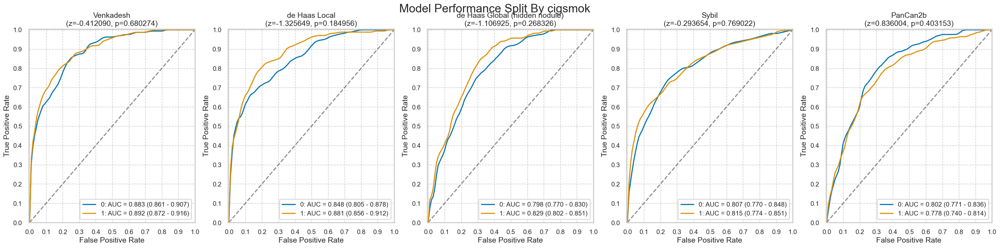

,num,pct,num_mal,pct_mal
0,1742,50.624818,169,9.701493
1,1699,49.375182,168,9.888170


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-0.412090,-1.325649,-1.106925,-0.293654,0.836004
p,0.680274,0.184956,0.268326,0.769022,0.403153


#### cigsmok: Gender = 2

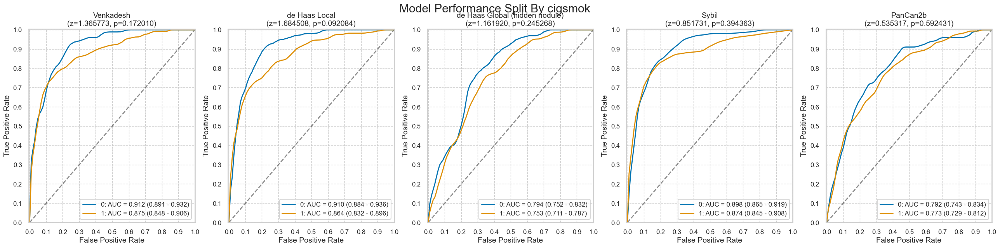

,num,pct,num_mal,pct_mal
0,1188,48.097166,98,8.249158
1,1282,51.902834,146,11.388456


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,1.365773,1.684508,1.161920,0.851731,0.535317
p,0.172010,0.092084,0.245268,0.394363,0.592431


#### pipe: Gender = 1

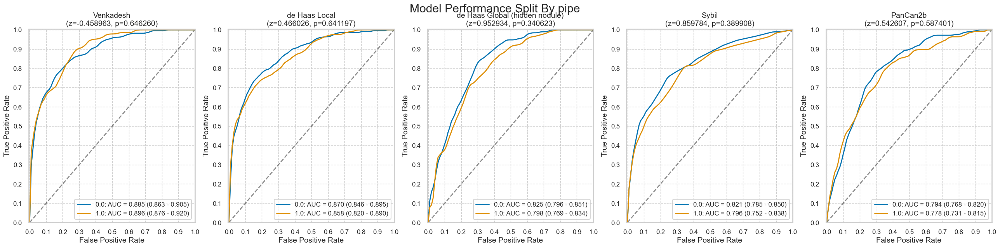

,num,pct,num_mal,pct_mal
0.0,2164,63.274854,197,9.103512
1.0,1256,36.725146,138,10.987261


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-0.458963,0.466026,0.952934,0.859784,0.542607
p,0.646260,0.641197,0.340623,0.389908,0.587401


#### pipe: Gender = 2

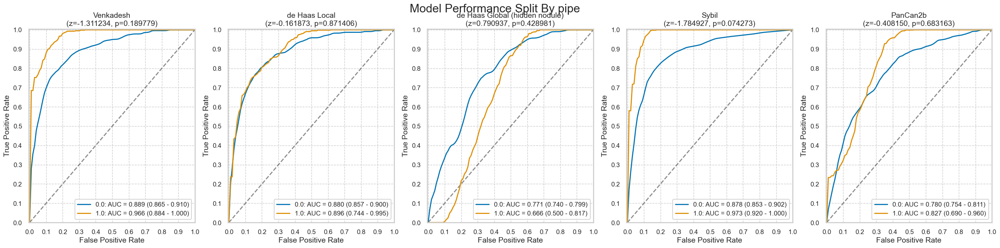

,num,pct,num_mal,pct_mal
0.0,2411,98.167752,239,9.912899
1.0,45,1.832248,5,11.111111


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-1.311234,-0.161873,0.790937,-1.784927,-0.408150
p,0.189779,0.871406,0.428981,0.074273,0.683163


#### smokelive: Gender = 1

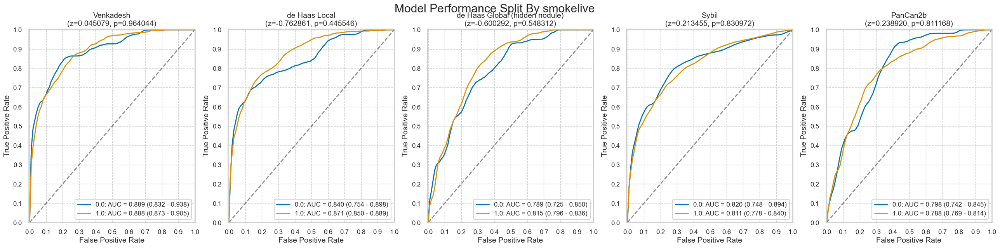

,num,pct,num_mal,pct_mal
0.0,541,15.82797,43,7.948244
1.0,2877,84.17203,292,10.149461


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.045079,-0.762861,-0.600292,0.213455,0.238920
p,0.964044,0.445546,0.548312,0.830972,0.811168


#### smokelive: Gender = 2

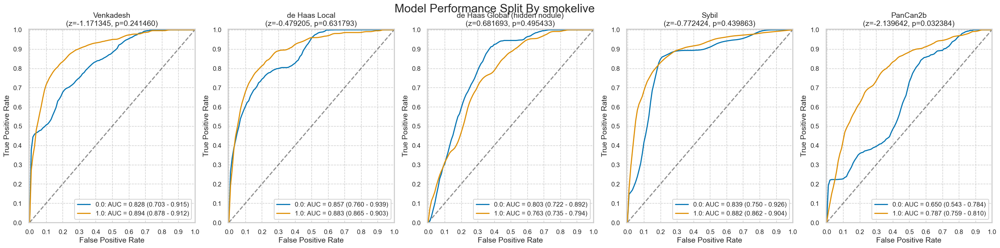

,num,pct,num_mal,pct_mal
0.0,124,5.044752,21,16.935484
1.0,2334,94.955248,222,9.511568


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-1.171345,-0.479205,0.681693,-0.772424,-2.139642
p,0.241460,0.631793,0.495433,0.439863,0.032384


#### smokework: Gender = 1

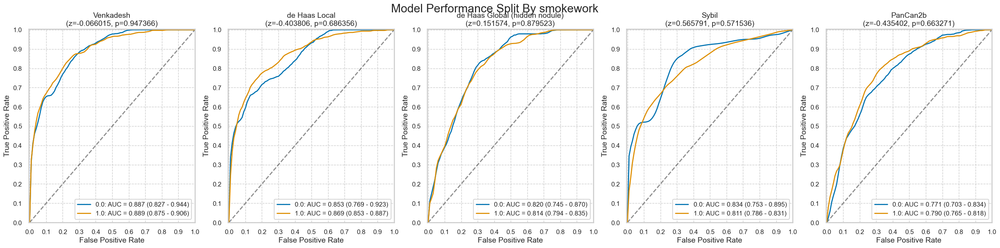

,num,pct,num_mal,pct_mal
0.0,379,11.101347,43,11.345646
1.0,3035,88.898653,291,9.588138


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-0.066015,-0.403806,0.151574,0.565791,-0.435402
p,0.947366,0.686356,0.879523,0.571536,0.663271


#### smokework: Gender = 2

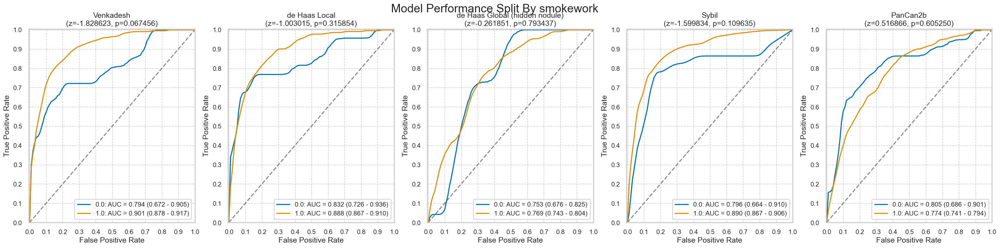

,num,pct,num_mal,pct_mal
0.0,343,14.005717,22,6.413994
1.0,2106,85.994283,221,10.493827


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-1.828623,-1.003015,-0.261851,-1.599834,0.516866
p,0.067456,0.315854,0.793437,0.109635,0.605250


In [64]:
for cat in nlst_democols['cat']['smoke']:
    plot_intersectional(nlst_preds, cat)

## Binning for numerical demographic columns

### Demographics

C:\Users\shaur\AppData\Local\Temp\ipykernel_21132\3338818666.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby('bin_Age')['label'].describe())


,count,mean,std,min,25%,50%,75%,max
bin_Age,,,,,,,,
"(53.999, 62.0]",2988.0,0.088353,0.283856,0.0,0.0,0.0,0.0,1.0
"(62.0, 76.0]",2923.0,0.108450,0.311001,0.0,0.0,0.0,0.0,1.0


#### bin_Age: Gender = 1

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:234: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


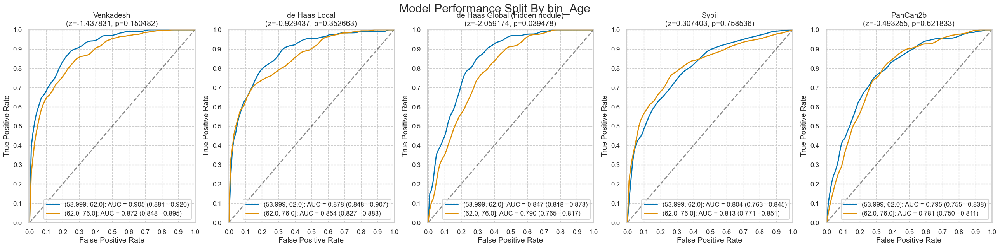

,num,pct,num_mal,pct_mal
"(53.999, 62.0]",1689,49.084568,138,8.170515
"(62.0, 76.0]",1752,50.915432,199,11.358447


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-1.437831,-0.929437,-2.059174,0.307403,-0.493255
p,0.150482,0.352663,0.039478,0.758536,0.621833


#### bin_Age: Gender = 2

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:234: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


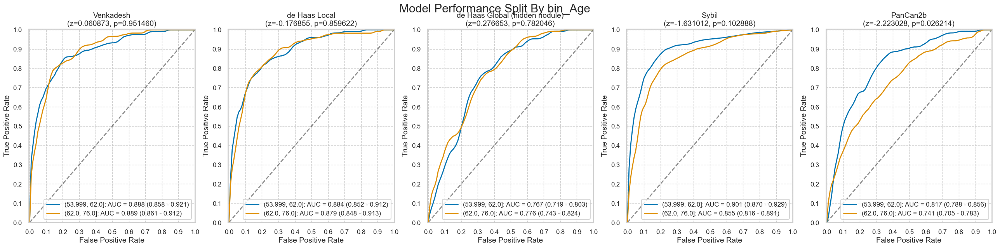

,num,pct,num_mal,pct_mal
"(53.999, 62.0]",1299,52.591093,126,9.699769
"(62.0, 76.0]",1171,47.408907,118,10.076857


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.060873,-0.176855,0.276653,-1.631012,-2.223028
p,0.951460,0.859622,0.782046,0.102888,0.026214


In [60]:
# nlst_preds['bin_Age'] = pd.cut(nlst_preds['Age'], bins=[55, 60, 65, 70, 78], right=False)
nlst_preds['bin_Age'] = pd.qcut(nlst_preds['Age'], q=2)
display(nlst_preds.groupby('bin_Age')['label'].describe())
plot_intersectional(nlst_preds, f'bin_Age')

C:\Users\shaur\AppData\Local\Temp\ipykernel_21132\1366853022.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby('bin_height')[['label', 'height']].describe())


label                                               height  \
             count      mean       std  min  25%  50%  75%  max   count   
bin_height                                                                
(48, 68]    3134.0  0.099553  0.299451  0.0  0.0  0.0  0.0  1.0  3134.0   
(68, 88]    2767.0  0.096494  0.295321  0.0  0.0  0.0  0.0  1.0  2767.0   

                                                               
                 mean       std   min   25%   50%   75%   max  
bin_height                                                     
(48, 68]    64.869177  2.355045  53.0  63.0  65.0  67.0  68.0  
(68, 88]    71.503072  1.994545  69.0  70.0  71.0  73.0  83.0

#### bin_height: Gender = 1

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:234: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


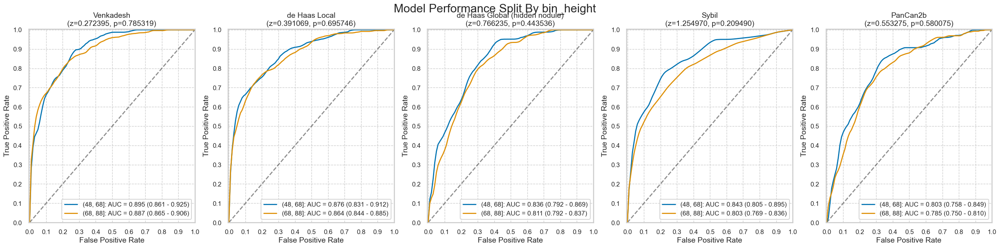

,num,pct,num_mal,pct_mal
"(48, 68]",812,23.652782,78,9.605911
"(68, 88]",2621,76.347218,257,9.805418


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.272395,0.391069,0.766235,1.25497,0.553275
p,0.785319,0.695746,0.443536,0.20949,0.580075


#### bin_height: Gender = 2

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:234: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


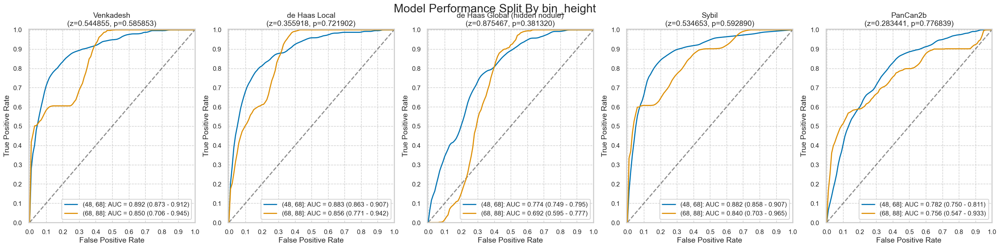

,num,pct,num_mal,pct_mal
"(48, 68]",2322,94.084279,234,10.077519
"(68, 88]",146,5.915721,10,6.849315


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.544855,0.355918,0.875467,0.534653,0.283441
p,0.585853,0.721902,0.381320,0.592890,0.776839


In [61]:
nlst_preds['bin_height'] = pd.cut(nlst_preds['height'], bins=[48, 68, 88], right=True)
display(nlst_preds.groupby('bin_height')[['label', 'height']].describe())
plot_intersectional(nlst_preds, f'bin_height')

C:\Users\shaur\AppData\Local\Temp\ipykernel_21132\936658290.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby('bin_weight')[['label', 'weight']].describe())


label                                               weight  \
             count      mean       std  min  25%  50%  75%  max   count   
bin_weight                                                                
(79, 179]   2855.0  0.105779  0.307609  0.0  0.0  0.0  0.0  1.0  2855.0   
(179, 279]  2961.0  0.091523  0.288400  0.0  0.0  0.0  0.0  1.0  2961.0   

                                                                     
                 mean        std    min    25%    50%    75%    max  
bin_weight                                                           
(79, 179]   150.09387  19.487052   88.0  137.0  154.0  165.0  179.0  
(179, 279]  209.49409  23.817196  180.0  190.0  204.0  225.0  279.0

#### bin_weight: Gender = 1

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:234: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


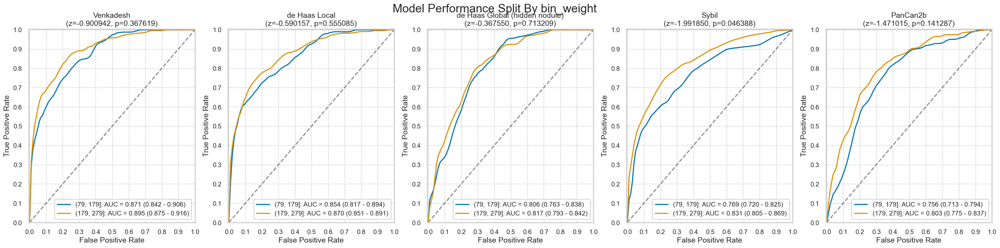

,num,pct,num_mal,pct_mal
"(79, 179]",1059,31.442993,104,9.820585
"(179, 279]",2309,68.557007,231,10.004331


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-0.900942,-0.590157,-0.367550,-1.991850,-1.471015
p,0.367619,0.555085,0.713209,0.046388,0.141287


#### bin_weight: Gender = 2

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:234: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


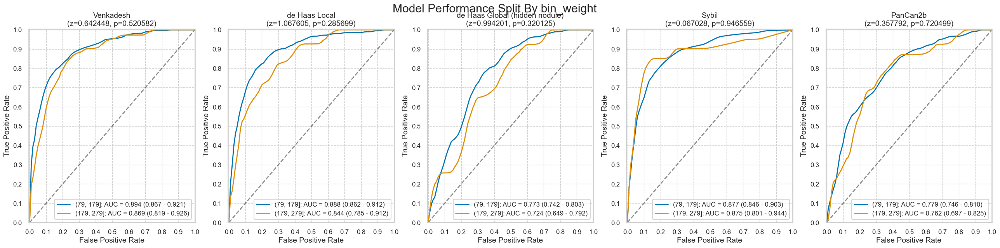

,num,pct,num_mal,pct_mal
"(79, 179]",1796,73.366013,198,11.024499
"(179, 279]",652,26.633987,40,6.134969


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.642448,1.067605,0.994201,0.067028,0.357792
p,0.520582,0.285699,0.320125,0.946559,0.720499


In [62]:
nlst_preds['bin_weight'] = pd.cut(nlst_preds['weight'], bins=[79, 179, 279], right=True)
display(nlst_preds.groupby('bin_weight')[['label', 'weight']].describe())
plot_intersectional(nlst_preds, f'bin_weight')

### Smoking

C:\Users\shaur\AppData\Local\Temp\ipykernel_21132\528562451.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())


label                                                 pkyr  \
                 count      mean       std  min  25%  50%  75%  max   count   
bin_pkyr                                                                      
(29.999, 51.0]  3027.0  0.079617  0.270744  0.0  0.0  0.0  0.0  1.0  3027.0   
(51.0, 260.0]   2884.0  0.117892  0.322536  0.0  0.0  0.0  0.0  1.0  2884.0   

                                                                      
                     mean        std    min   25%   50%   75%    max  
bin_pkyr                                                              
(29.999, 51.0]  40.627800   5.760036  30.00  36.0  41.0  45.0   51.0  
(51.0, 260.0]   76.879785  24.261537  51.25  60.0  70.0  87.5  260.0

#### bin_pkyr: Gender = 1

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:234: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


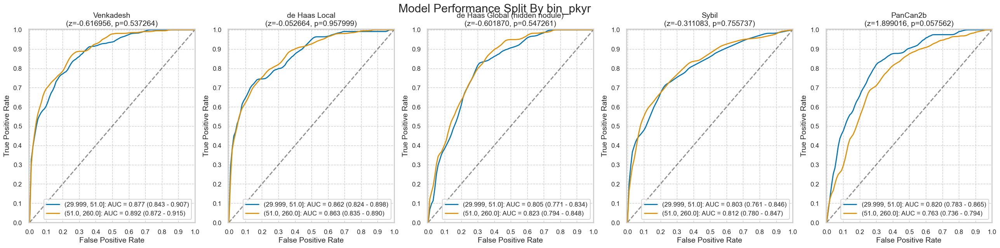

,num,pct,num_mal,pct_mal
"(29.999, 51.0]",1528,44.405696,117,7.657068
"(51.0, 260.0]",1913,55.594304,220,11.500261


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-0.616956,-0.052664,-0.601870,-0.311083,1.899016
p,0.537264,0.957999,0.547261,0.755737,0.057562


#### bin_pkyr: Gender = 2

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:234: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


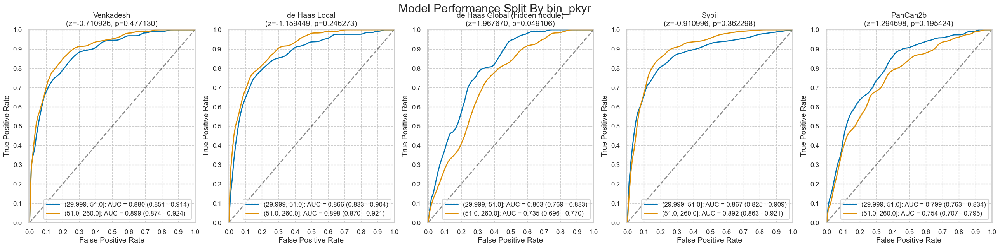

,num,pct,num_mal,pct_mal
"(29.999, 51.0]",1499,60.688259,124,8.272181
"(51.0, 260.0]",971,39.311741,120,12.358393


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-0.710926,-1.159449,1.967670,-0.910996,1.294698
p,0.477130,0.246273,0.049106,0.362298,0.195424


C:\Users\shaur\AppData\Local\Temp\ipykernel_21132\528562451.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())


label                                              smokeage  \
                count      mean       std  min  25%  50%  75%  max    count   
bin_smokeage                                                                  
(4.999, 16.0]  3256.0  0.106572  0.308616  0.0  0.0  0.0  0.0  1.0   3256.0   
(16.0, 40.0]   2655.0  0.088136  0.283545  0.0  0.0  0.0  0.0  1.0   2655.0   

                                                                  
                    mean       std   min   25%   50%   75%   max  
bin_smokeage                                                      
(4.999, 16.0]  14.136978  2.000377   5.0  13.0  15.0  16.0  16.0  
(16.0, 40.0]   19.381544  2.716198  17.0  18.0  18.0  20.0  40.0

#### bin_smokeage: Gender = 1

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:234: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


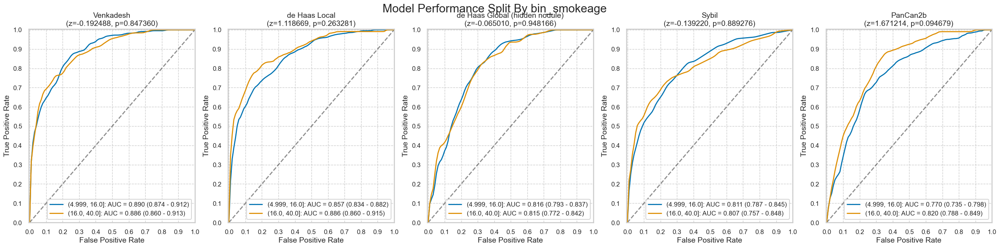

,num,pct,num_mal,pct_mal
"(4.999, 16.0]",2034,59.110724,214,10.521141
"(16.0, 40.0]",1407,40.889276,123,8.742004


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-0.192488,1.118669,-0.065010,-0.139220,1.671214
p,0.847360,0.263281,0.948166,0.889276,0.094679


#### bin_smokeage: Gender = 2

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:234: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


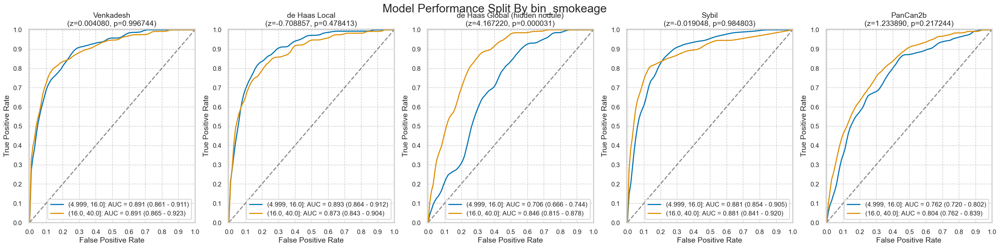

,num,pct,num_mal,pct_mal
"(4.999, 16.0]",1222,49.473684,133,10.883797
"(16.0, 40.0]",1248,50.526316,111,8.894231


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.004080,-0.708857,4.167220,-0.019048,1.233890
p,0.996744,0.478413,0.000031,0.984803,0.217244


C:\Users\shaur\AppData\Local\Temp\ipykernel_21132\528562451.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())


label                                              smokeday  \
                 count      mean       std  min  25%  50%  75%  max    count   
bin_smokeday                                                                   
(11.999, 25.0]  3119.0  0.089772  0.285901  0.0  0.0  0.0  0.0  1.0   3119.0   
(25.0, 135.0]   2792.0  0.107808  0.310193  0.0  0.0  0.0  0.0  1.0   2792.0   

                                                                     
                     mean        std   min   25%   50%   75%    max  
bin_smokeday                                                         
(11.999, 25.0]  20.117025   2.153974  12.0  20.0  20.0  20.0   25.0  
(25.0, 135.0]   38.157593  10.650142  26.0  30.0  40.0  40.0  135.0

#### bin_smokeday: Gender = 1

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:234: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


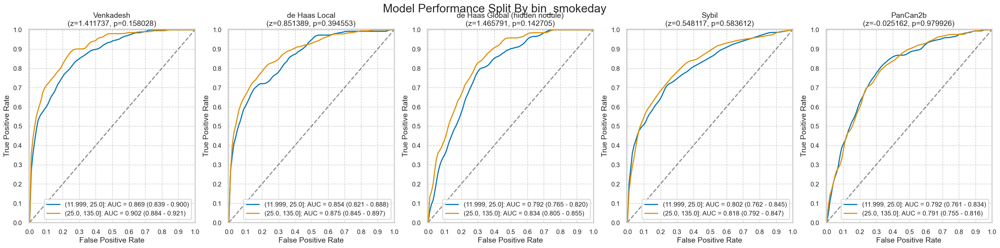

,num,pct,num_mal,pct_mal
"(11.999, 25.0]",1614,46.904969,141,8.736059
"(25.0, 135.0]",1827,53.095031,196,10.727969


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,1.411737,0.851389,1.465791,0.548117,-0.025162
p,0.158028,0.394553,0.142705,0.583612,0.979926


#### bin_smokeday: Gender = 2

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:234: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


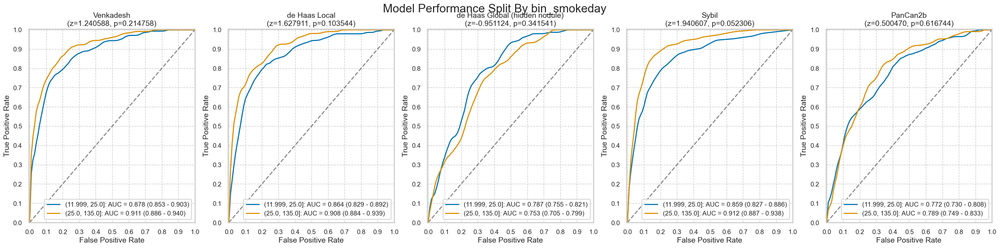

,num,pct,num_mal,pct_mal
"(11.999, 25.0]",1505,60.931174,139,9.235880
"(25.0, 135.0]",965,39.068826,105,10.880829


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,1.240588,1.627911,-0.951124,1.940607,0.500470
p,0.214758,0.103544,0.341541,0.052306,0.616744


C:\Users\shaur\AppData\Local\Temp\ipykernel_21132\528562451.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())


label                                              smokeyr  \
                 count      mean       std  min  25%  50%  75%  max   count   
bin_smokeyr                                                                   
(15.999, 41.0]  3073.0  0.070290  0.255676  0.0  0.0  0.0  0.0  1.0  3073.0   
(41.0, 67.0]    2838.0  0.128612  0.334829  0.0  0.0  0.0  0.0  1.0  2838.0   

                                                                   
                     mean       std   min   25%   50%   75%   max  
bin_smokeyr                                                        
(15.999, 41.0]  35.559714  4.645131  16.0  33.0  36.0  39.0  41.0  
(41.0, 67.0]    47.241720  4.421492  42.0  44.0  46.0  50.0  67.0

#### bin_smokeyr: Gender = 1

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:234: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


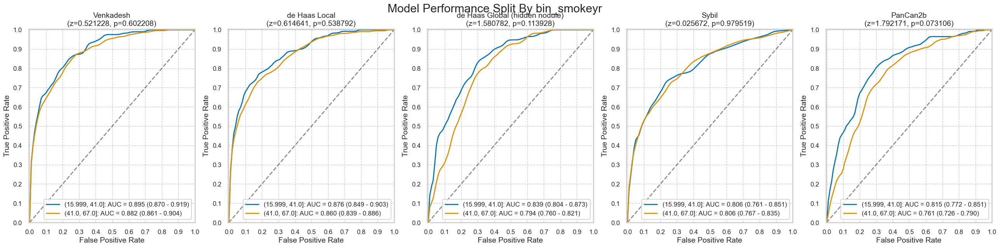

,num,pct,num_mal,pct_mal
"(15.999, 41.0]",1709,49.665795,117,6.846109
"(41.0, 67.0]",1732,50.334205,220,12.702079


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.521228,0.614641,1.580782,0.025672,1.792171
p,0.602208,0.538792,0.113928,0.979519,0.073106


#### bin_smokeyr: Gender = 2

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:234: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


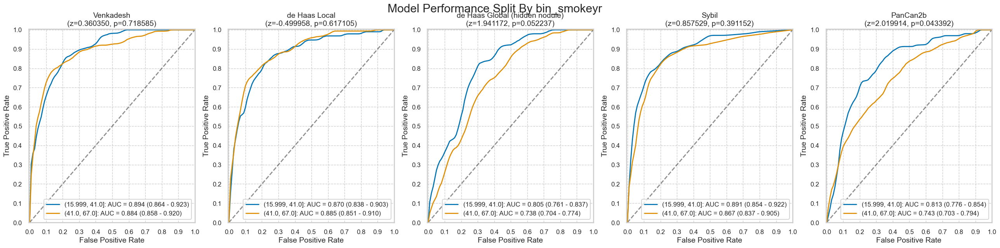

,num,pct,num_mal,pct_mal
"(15.999, 41.0]",1364,55.222672,99,7.258065
"(41.0, 67.0]",1106,44.777328,145,13.110307


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.360350,-0.499958,1.941172,0.857529,2.019914
p,0.718585,0.617105,0.052237,0.391152,0.043392


In [65]:
for c in nlst_democols['num']['smoke']:
    nlst_preds[f'bin_{c}'] = pd.qcut(nlst_preds[c], q=2)
    display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())
    plot_intersectional(nlst_preds, f'bin_{c}')